<a href="https://colab.research.google.com/github/Abishethvarman/FakeNewsDetection/blob/main/V1_4_Sentiment_Analysis_TextBlob%2BVADER_FakeNews_Full_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Sentiment Analysis on TEXTBLOB https://drive.google.com/drive/folders/1ya2UGUuTjE_YmNv9kw6F3vP-Cd-Up7H7

In [1]:
!pip install gensim

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
nltk.download('vader_lexicon')

from PIL import Image
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

import nltk
import gensim
from nltk.corpus import stopwords
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.sentiment import SentimentIntensityAnalyzer
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('vader_lexicon')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')

import plotly.express as px
from tqdm.notebook import tqdm

plt.style.use('ggplot')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

In [4]:
%cd /mydrive/dataset/

/content/gdrive/My Drive/dataset


In [5]:
df_reliable = pd.read_csv("Reliable.csv")
df_fake = pd.read_csv("Fake.csv")

In [6]:
df_reliable['isfake'] = 0
df_fake['isfake'] = 1

In [7]:
target_samples = 10000
reliable_news = df_reliable[df_reliable['isfake'] == 0].sample(n=target_samples, random_state=42)
fake_news = df_fake[df_fake['isfake'] == 1].sample(n=target_samples, random_state=42)

df_adjusted = pd.concat([reliable_news, fake_news], ignore_index=True)
df_adjusted = df_adjusted.sample(frac=1, random_state=42)

In [8]:
df_adjusted.shape

(20000, 5)

In [9]:
df_adjusted

,title,text,subject,date,isfake
10650,Vicente Fox Brilliantly Trolls Trump’s Disast...,Former Mexican President Vicente Fox has never...,News,"May 17, 2017",1
2041,U.S. and EU warn China on need to respect Sout...,WASHINGTON (Reuters) - The United States and t...,politicsNews,"February 18, 2016",0
8668,UK Supreme Court hears attempt to change North...,LONDON (Reuters) - An attempt to change the la...,worldnews,"October 24, 2017",0
1114,Guatemalan president survives congressional vo...,GUATEMALA CITY (Reuters) - Guatemala s Congres...,worldnews,"September 12, 2017",0
13902,Mueller Team Uniform? ‘Democratic Donkey Jerse...,Deputy Attorney General Rod Rosenstein appeare...,Middle-east,"December 13, 2017",1
...,...,...,...,...,...
11284,White House Defends Boehner’s ‘Lucifer’ Comme...,Ever since former House Speaker John Boehner a...,News,"April 29, 2016",1
11964,HILARIOUS: TRUMP EXPOSES STUPIDITY OF NBC PUPP...,Trump made sure everyone got a chance to see h...,politics,"Aug 19, 2015",1
5390,Mueller seeking testimony from PR executives w...,WASHINGTON (Reuters) - Special Counsel Robert ...,politicsNews,"August 25, 2017",0
860,Supreme Court dismisses Hawaii's challenge to ...,WASHINGTON (Reuters) - The U.S. Supreme Court ...,politicsNews,"October 24, 2017",0


In [10]:
print(df_reliable['subject'].unique())
print(df_fake['subject'].unique())

['politicsNews' 'worldnews']
['News' 'politics' 'Government News' 'left-news' 'US_News' 'Middle-east']


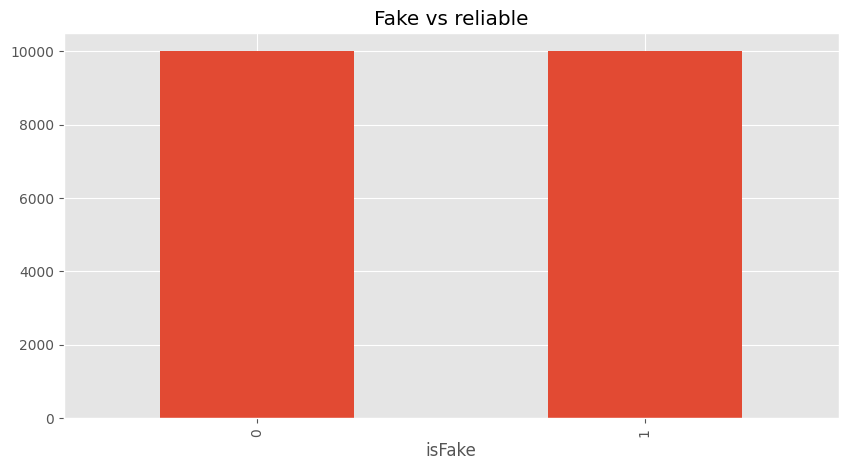

In [12]:
ax = df_adjusted['isfake'].value_counts().sort_index() \
    .plot(kind='bar',
          title='Fake vs reliable',
          figsize=(10, 5))
ax.set_xlabel('isFake')
plt.show()

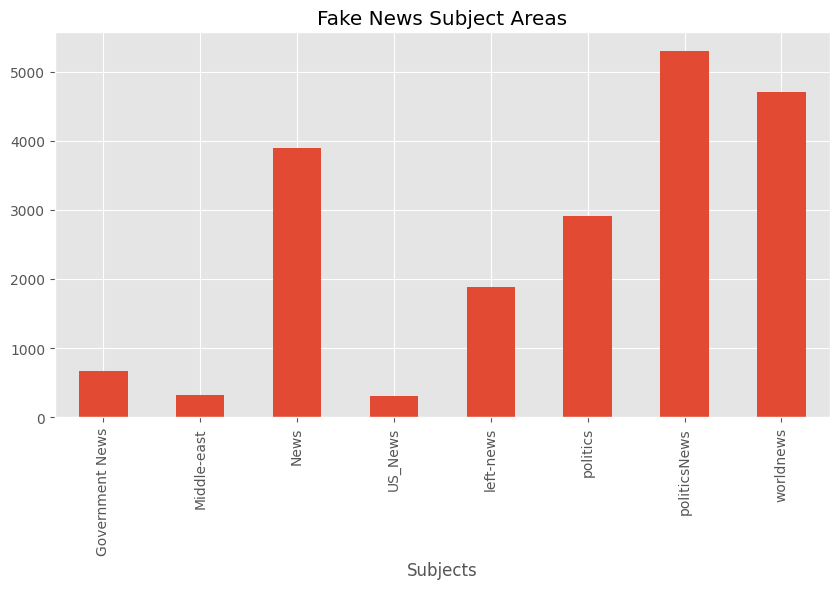

In [14]:
ax = df_adjusted['subject'].value_counts().sort_index() \
    .plot(kind='bar',
          title='Fake News Subject Areas',
          figsize=(10, 5))
ax.set_xlabel('Subjects')
plt.show()

In [15]:
df_adjusted['original'] = df_adjusted['title'] + ' ' + df_adjusted['text']
df_adjusted.head()

,title,text,subject,date,isfake,original
10650,Vicente Fox Brilliantly Trolls Trump’s Disast...,Former Mexican President Vicente Fox has never...,News,"May 17, 2017",1,Vicente Fox Brilliantly Trolls Trump’s Disast...
2041,U.S. and EU warn China on need to respect Sout...,WASHINGTON (Reuters) - The United States and t...,politicsNews,"February 18, 2016",0,U.S. and EU warn China on need to respect Sout...
8668,UK Supreme Court hears attempt to change North...,LONDON (Reuters) - An attempt to change the la...,worldnews,"October 24, 2017",0,UK Supreme Court hears attempt to change North...
1114,Guatemalan president survives congressional vo...,GUATEMALA CITY (Reuters) - Guatemala s Congres...,worldnews,"September 12, 2017",0,Guatemalan president survives congressional vo...
13902,Mueller Team Uniform? ‘Democratic Donkey Jerse...,Deputy Attorney General Rod Rosenstein appeare...,Middle-east,"December 13, 2017",1,Mueller Team Uniform? ‘Democratic Donkey Jerse...


In [16]:
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use','said'])

In [17]:
from gensim.parsing.preprocessing import STOPWORDS, remove_stopword_tokens
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3 and token not in stop_words:
            result.append(token)

    return result


In [18]:
# Apply the function to the dataframe
df_adjusted['clean'] = df_adjusted['original'].apply(preprocess)

In [19]:
print(df_adjusted['clean'][0])

['europe', 'rights', 'watchdog', 'says', 'turkey', 'emergency', 'laws', 'brussels', 'reuters', 'leading', 'european', 'rights', 'watchdog', 'called', 'turkey', 'friday', 'ease', 'post', 'coup', 'state', 'emergency', 'laws', 'seen', 'thousands', 'arrested', 'restore', 'power', 'regional', 'authorities', 'president', 'tayyip', 'erdogan', 'overseen', 'mass', 'purge', 'armed', 'forces', 'judiciary', 'crackdown', 'critics', 'including', 'academics', 'journalists', 'failed', 'military', 'coup', 'july', 'year', 'advisory', 'body', 'council', 'europe', 'turkey', 'member', 'acknowledged', 'report', 'need', 'certain', 'extraordinary', 'steps', 'taken', 'turkish', 'authorities', 'face', 'dangerous', 'armed', 'conspiracy', 'turkish', 'authorities', 'interpreted', 'extraordinary', 'powers', 'extensively', 'said', 'experts', 'known', 'venice', 'commission', 'opinion', 'legal', 'force', 'urged', 'ankara', 'lift', 'laws', 'allowing', 'pick', 'mayors', 'deputy', 'mayors', 'members', 'local', 'councils'

In [20]:
list_of_words = []
for i in df_adjusted.clean:
    for j in i:
        list_of_words.append(j)

In [21]:
list_of_words

['vicente',
 'brilliantly',
 'trolls',
 'trump',
 'disastrous',
 'week',
 'glorious',
 'mexican',
 'president',
 'vicente',
 'donald',
 'trump',
 'presidential',
 'campaign',
 'routinely',
 'went',
 'trump',
 'disparaging',
 'remarks',
 'mexican',
 'immigrants',
 'infamously',
 'said',
 'mexico',
 'king',
 'wall',
 'president',
 'trump',
 'favorite',
 'platform',
 'twitter',
 'troll',
 'absolute',
 'incompetence',
 'coming',
 'white',
 'house',
 'trump',
 'like',
 'paid',
 'attention',
 'donald',
 'trump',
 'campaign',
 'ascent',
 'white',
 'house',
 'knows',
 'presidential',
 'running',
 'nation',
 'donald',
 'trump',
 'insatiable',
 'insecurity',
 'constant',
 'quest',
 'money',
 'power',
 'lifelong',
 'pattern',
 'running',
 'president',
 'thing',
 'left',
 'president',
 'tweeted',
 'realdonaldtrump',
 'weepy',
 'wanted',
 'center',
 'attention',
 'kind',
 'wanted',
 'right',
 'vicente',
 'quesada',
 'vicentefoxque',
 'trump',
 'thought',
 'president',
 'govern',
 'likely',
 'though

In [22]:
len(list_of_words)
total_words = len(list(set(list_of_words)))
total_words

77343

In [23]:
df_adjusted['clean_joined'] = df_adjusted['clean'].apply(lambda x: " ".join(x))
df_adjusted

,title,text,subject,date,isfake,original,clean,clean_joined
10650,Vicente Fox Brilliantly Trolls Trump’s Disast...,Former Mexican President Vicente Fox has never...,News,"May 17, 2017",1,Vicente Fox Brilliantly Trolls Trump’s Disast...,"[vicente, brilliantly, trolls, trump, disastro...",vicente brilliantly trolls trump disastrous we...
2041,U.S. and EU warn China on need to respect Sout...,WASHINGTON (Reuters) - The United States and t...,politicsNews,"February 18, 2016",0,U.S. and EU warn China on need to respect Sout...,"[warn, china, need, respect, south, china, rul...",warn china need respect south china ruling was...
8668,UK Supreme Court hears attempt to change North...,LONDON (Reuters) - An attempt to change the la...,worldnews,"October 24, 2017",0,UK Supreme Court hears attempt to change North...,"[supreme, court, hears, attempt, change, north...",supreme court hears attempt change northern ir...
1114,Guatemalan president survives congressional vo...,GUATEMALA CITY (Reuters) - Guatemala s Congres...,worldnews,"September 12, 2017",0,Guatemalan president survives congressional vo...,"[guatemalan, president, survives, congressiona...",guatemalan president survives congressional vo...
13902,Mueller Team Uniform? ‘Democratic Donkey Jerse...,Deputy Attorney General Rod Rosenstein appeare...,Middle-east,"December 13, 2017",1,Mueller Team Uniform? ‘Democratic Donkey Jerse...,"[mueller, team, uniform, democratic, donkey, j...",mueller team uniform democratic donkey jerseys...
...,...,...,...,...,...,...,...,...
11284,White House Defends Boehner’s ‘Lucifer’ Comme...,Ever since former House Speaker John Boehner a...,News,"April 29, 2016",1,White House Defends Boehner’s ‘Lucifer’ Comme...,"[white, house, defends, boehner, lucifer, comm...",white house defends boehner lucifer comment cr...
11964,HILARIOUS: TRUMP EXPOSES STUPIDITY OF NBC PUPP...,Trump made sure everyone got a chance to see h...,politics,"Aug 19, 2015",1,HILARIOUS: TRUMP EXPOSES STUPIDITY OF NBC PUPP...,"[hilarious, trump, exposes, stupidity, puppet,...",hilarious trump exposes stupidity puppet repor...
5390,Mueller seeking testimony from PR executives w...,WASHINGTON (Reuters) - Special Counsel Robert ...,politicsNews,"August 25, 2017",0,Mueller seeking testimony from PR executives w...,"[mueller, seeking, testimony, executives, mana...",mueller seeking testimony executives manafort ...
860,Supreme Court dismisses Hawaii's challenge to ...,WASHINGTON (Reuters) - The U.S. Supreme Court ...,politicsNews,"October 24, 2017",0,Supreme Court dismisses Hawaii's challenge to ...,"[supreme, court, dismisses, hawaii, challenge,...",supreme court dismisses hawaii challenge trump...


In [24]:
example = df_adjusted['clean_joined']
print(example)

10650    vicente brilliantly trolls trump disastrous we...
2041     warn china need respect south china ruling was...
8668     supreme court hears attempt change northern ir...
1114     guatemalan president survives congressional vo...
13902    mueller team uniform democratic donkey jerseys...
                               ...                        
11284    white house defends boehner lucifer comment cr...
11964    hilarious trump exposes stupidity puppet repor...
5390     mueller seeking testimony executives manafort ...
860      supreme court dismisses hawaii challenge trump...
15795    woman wants chair shut white people prejudiced...
Name: clean_joined, Length: 20000, dtype: object


In [30]:
#Calculating Negative, Positive, Neutral and Compound values

df_adjusted[['polarity', 'subjectivity']] = df_adjusted['clean_joined'].apply(lambda Text: pd.Series(TextBlob(Text).sentiment))
for index, row in df_adjusted['clean_joined'].iteritems():
    score = SentimentIntensityAnalyzer().polarity_scores(row)
    neg = score['neg']
    neu = score['neu']
    pos = score['pos']
    comp = score['compound']
    if comp <= -0.05:
        df_adjusted.loc[index, 'sentiment'] = "negative"
    elif comp >= 0.05:
        df_adjusted.loc[index, 'sentiment'] = "positive"
    else:
        df_adjusted.loc[index, 'sentiment'] = "neutral"
    df_adjusted.loc[index, 'neg'] = neg
    df_adjusted.loc[index, 'neu'] = neu
    df_adjusted.loc[index, 'pos'] = pos
    df_adjusted.loc[index, 'compound'] = comp

example.head(5)

<ipython-input-30-24b725d28a37>:4: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, row in df_adjusted['clean_joined'].iteritems():


10650    vicente brilliantly trolls trump disastrous we...
2041     warn china need respect south china ruling was...
8668     supreme court hears attempt change northern ir...
1114     guatemalan president survives congressional vo...
13902    mueller team uniform democratic donkey jerseys...
Name: clean_joined, dtype: object

In [31]:
df_adjusted.head()

,title,text,subject,date,isfake,original,clean,clean_joined,polarity,subjectivity,sentiment,neg,neu,pos,compound
10650,Vicente Fox Brilliantly Trolls Trump’s Disast...,Former Mexican President Vicente Fox has never...,News,"May 17, 2017",1,Vicente Fox Brilliantly Trolls Trump’s Disast...,"[vicente, brilliantly, trolls, trump, disastro...",vicente brilliantly trolls trump disastrous we...,0.103429,0.483333,positive,0.159,0.660,0.181,0.6597
2041,U.S. and EU warn China on need to respect Sout...,WASHINGTON (Reuters) - The United States and t...,politicsNews,"February 18, 2016",0,U.S. and EU warn China on need to respect Sout...,"[warn, china, need, respect, south, china, rul...",warn china need respect south china ruling was...,0.036477,0.314011,positive,0.118,0.648,0.234,0.9838
8668,UK Supreme Court hears attempt to change North...,LONDON (Reuters) - An attempt to change the la...,worldnews,"October 24, 2017",0,UK Supreme Court hears attempt to change North...,"[supreme, court, hears, attempt, change, north...",supreme court hears attempt change northern ir...,0.018333,0.264722,negative,0.190,0.691,0.119,-0.9831
1114,Guatemalan president survives congressional vo...,GUATEMALA CITY (Reuters) - Guatemala s Congres...,worldnews,"September 12, 2017",0,Guatemalan president survives congressional vo...,"[guatemalan, president, survives, congressiona...",guatemalan president survives congressional vo...,-0.018750,0.325000,negative,0.234,0.717,0.050,-0.9628
13902,Mueller Team Uniform? ‘Democratic Donkey Jerse...,Deputy Attorney General Rod Rosenstein appeare...,Middle-east,"December 13, 2017",1,Mueller Team Uniform? ‘Democratic Donkey Jerse...,"[mueller, team, uniform, democratic, donkey, j...",mueller team uniform democratic donkey jerseys...,0.290079,0.561949,positive,0.121,0.688,0.190,0.9403


In [32]:
#Creating new data frames for all sentiments (positive, negative and neutral)

df_adjusted_negative = df_adjusted[df_adjusted["sentiment"]=="negative"]
df_adjusted_positive = df_adjusted[df_adjusted["sentiment"]=="positive"]
df_adjusted_neutral = df_adjusted[df_adjusted["sentiment"]=="neutral"]

In [33]:
#Function for count_values_in single columns

def count_values_in_column(data,feature):
    total=data.loc[:,feature].value_counts(dropna=False)
    percentage=round(data.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
    return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])

In [34]:
#Count_values for sentiment
count_values_in_column(df_adjusted,"sentiment")

,Total,Percentage
positive,10021,50.10
negative,9596,47.98
neutral,383,1.92


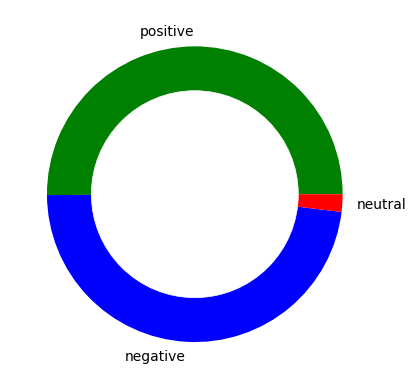

In [35]:
# create data for Pie Chart
pichart = count_values_in_column(df_adjusted,"sentiment")
# names= pc.index
# size=pc["Percentage"]

names= pichart.index
size=pichart["Percentage"]

# Create a circle for the center of the plot
my_circle=plt.Circle( (0,0), 0.7, color='white')
plt.pie(size, labels=names, colors=['green','blue','red'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

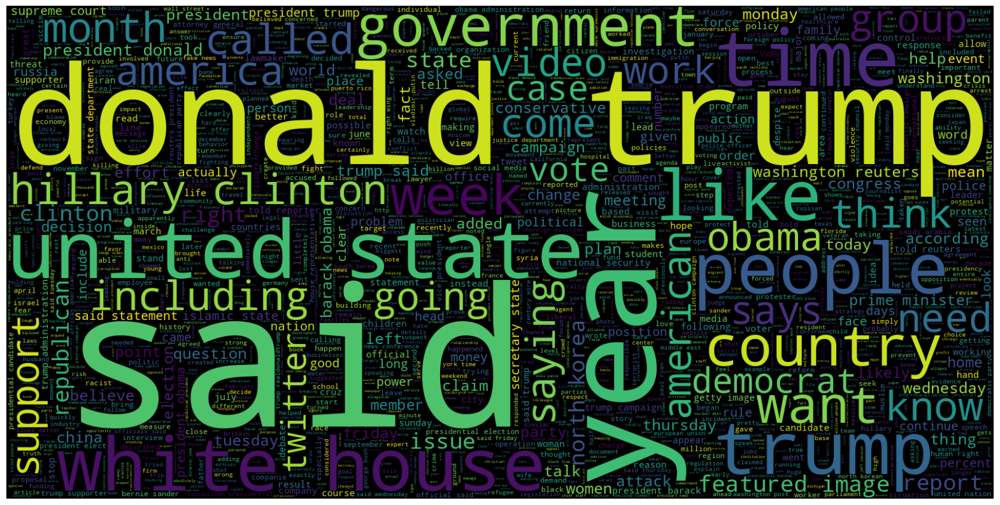

In [81]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming df_adjusted['clean'] contains lists of strings
positive_text = " ".join(df_adjusted.clean.apply(lambda x: ' '.join(x)))

# Create and display the word cloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=2000, width=1600, height=800, stopwords=stop_words).generate(positive_text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")  # Optional: Turn off the axis
plt.show()

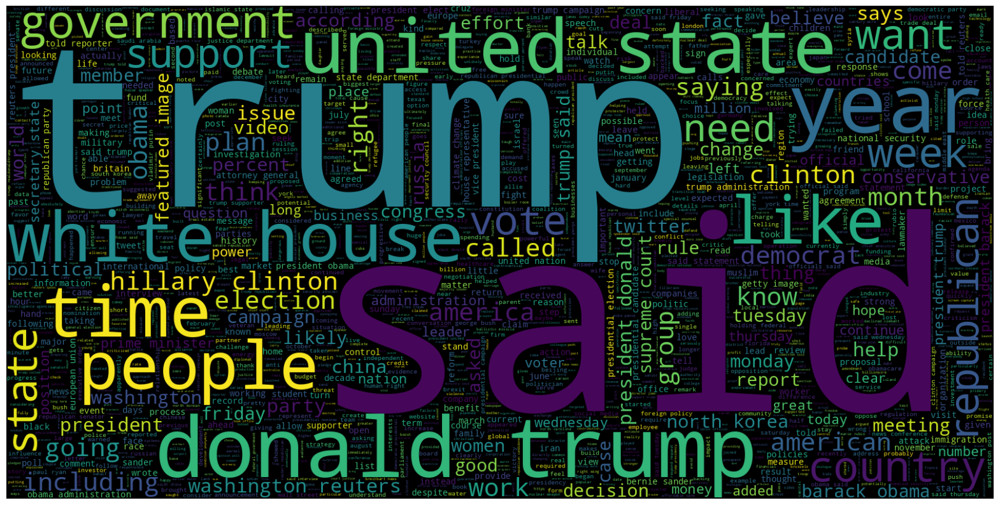

In [63]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming df_adjusted['clean'] contains lists of strings
positive_text = " ".join(df_adjusted[df_adjusted.sentiment == 'positive'].clean.apply(lambda x: ' '.join(x)))

# Create and display the word cloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=2000, width=1600, height=800, stopwords=stop_words).generate(positive_text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")  # Optional: Turn off the axis
plt.show()


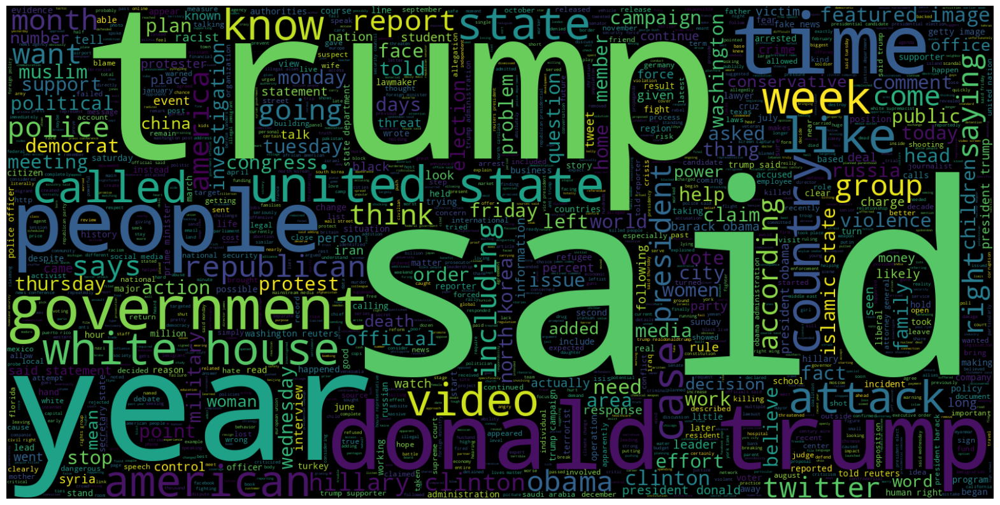

In [74]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming df_adjusted['clean'] contains lists of strings
negative_text = " ".join(df_adjusted[df_adjusted.sentiment == 'negative'].clean.apply(lambda x: ' '.join(x)))

# Create and display the word cloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=2000, width=1600, height=800, stopwords=stop_words).generate(negative_text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")  # Optional: Turn off the axis
plt.show()

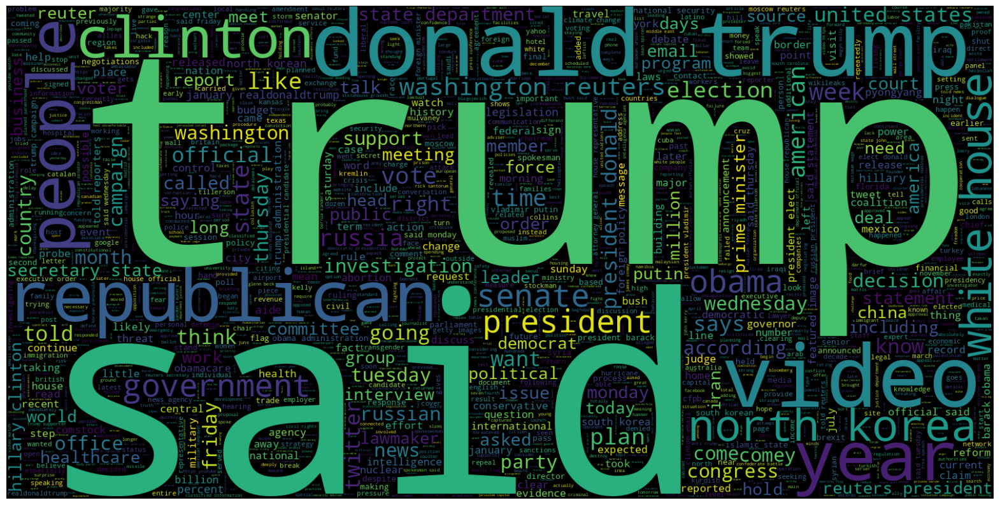

In [65]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming df_adjusted['clean'] contains lists of strings
neutral_text = " ".join(df_adjusted[df_adjusted.sentiment == 'neutral'].clean.apply(lambda x: ' '.join(x)))

# Create and display the word cloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=2000, width=1600, height=800, stopwords=stop_words).generate(neutral_text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")  # Optional: Turn off the axis
plt.show()

In [83]:
#Calculating tweet's lenght and word count
df_adjusted['text_len'] = df_adjusted['clean'].astype(str).apply(len)
df_adjusted['text_word_count'] = df_adjusted['clean'].apply(lambda x: len(str(x).split()))

In [84]:
round(pd.DataFrame(df_adjusted.groupby("sentiment").text_len.mean()),2)

,text_len
sentiment,
negative,2275.88
neutral,916.24
positive,2234.42


In [85]:
round(pd.DataFrame(df_adjusted.groupby("sentiment").text_word_count.mean()),2)

,text_word_count
sentiment,
negative,210.99
neutral,84.99
positive,206.44


In [86]:
df_adjusted.to_csv("./c2_sentimentanalysis_output.csv", sep=',', encoding='UTF-8')
df_adjusted.head(5)

,title,text,subject,date,isfake,original,clean,clean_joined,polarity,subjectivity,sentiment,neg,neu,pos,compound,text_len,text_word_count
10650,Vicente Fox Brilliantly Trolls Trump’s Disast...,Former Mexican President Vicente Fox has never...,News,"May 17, 2017",1,Vicente Fox Brilliantly Trolls Trump’s Disast...,"[vicente, brilliantly, trolls, trump, disastro...",vicente brilliantly trolls trump disastrous we...,0.103429,0.483333,positive,0.159,0.660,0.181,0.6597,1685,158
2041,U.S. and EU warn China on need to respect Sout...,WASHINGTON (Reuters) - The United States and t...,politicsNews,"February 18, 2016",0,U.S. and EU warn China on need to respect Sout...,"[warn, china, need, respect, south, china, rul...",warn china need respect south china ruling was...,0.036477,0.314011,positive,0.118,0.648,0.234,0.9838,2603,239
8668,UK Supreme Court hears attempt to change North...,LONDON (Reuters) - An attempt to change the la...,worldnews,"October 24, 2017",0,UK Supreme Court hears attempt to change North...,"[supreme, court, hears, attempt, change, north...",supreme court hears attempt change northern ir...,0.018333,0.264722,negative,0.190,0.691,0.119,-0.9831,2869,267
1114,Guatemalan president survives congressional vo...,GUATEMALA CITY (Reuters) - Guatemala s Congres...,worldnews,"September 12, 2017",0,Guatemalan president survives congressional vo...,"[guatemalan, president, survives, congressiona...",guatemalan president survives congressional vo...,-0.018750,0.325000,negative,0.234,0.717,0.050,-0.9628,1108,97
13902,Mueller Team Uniform? ‘Democratic Donkey Jerse...,Deputy Attorney General Rod Rosenstein appeare...,Middle-east,"December 13, 2017",1,Mueller Team Uniform? ‘Democratic Donkey Jerse...,"[mueller, team, uniform, democratic, donkey, j...",mueller team uniform democratic donkey jerseys...,0.290079,0.561949,positive,0.121,0.688,0.190,0.9403,1704,153


In [ ]:
# tokens = nltk.word_tokenize(example)
tokens = nltk.word_tokenize(str(example))
tokens[:10]

['10650',
 'vicente',
 'brilliantly',
 'trolls',
 'trump',
 'disastrous',
 'we',
 '...',
 '2041',
 'warn']

In [ ]:
tagged = nltk.pos_tag(tokens)
tagged[:10]

[('10650', 'CD'),
 ('vicente', 'NN'),
 ('brilliantly', 'RB'),
 ('trolls', 'VBZ'),
 ('trump', 'JJ'),
 ('disastrous', 'JJ'),
 ('we', 'PRP'),
 ('...', ':'),
 ('2041', 'CD'),
 ('warn', 'IN')]

In [ ]:
entities = nltk.chunk.ne_chunk(tagged)
entities.pprint()

(S
  10650/CD
  vicente/NN
  brilliantly/RB
  trolls/VBZ
  trump/JJ
  disastrous/JJ
  we/PRP
  .../:
  2041/CD
  warn/IN
  china/NNS
  need/VBP
  respect/JJ
  south/JJ
  china/NN
  ruling/NN
  was/VBD
  .../:
  8668/CD
  supreme/JJ
  court/NN
  hears/NNS
  attempt/VBP
  change/NN
  northern/JJ
  ir/NN
  .../:
  1114/CD
  guatemalan/NN
  president/NN
  survives/VBZ
  congressional/JJ
  vo/NN
  .../:
  13902/CD
  mueller/NN
  team/NN
  uniform/RB
  democratic/JJ
  donkey/NN
  jerseys/NNS
  .../:
  .../:
  11284/CD
  white/JJ
  house/NN
  defends/VBZ
  boehner/NN
  lucifer/JJ
  comment/NN
  cr/NN
  .../:
  11964/CD
  hilarious/JJ
  trump/NN
  exposes/VBZ
  stupidity/NN
  puppet/NN
  repor/NN
  .../:
  5390/CD
  mueller/NN
  seeking/VBG
  testimony/NN
  executives/NNS
  manafort/VBP
  .../:
  860/CD
  supreme/JJ
  court/NN
  dismisses/NNS
  hawaii/VBP
  challenge/NN
  trump/NN
  .../:
  15795/CD
  woman/NN
  wants/VBZ
  chair/JJ
  shut/JJ
  white/JJ
  people/NNS
  prejudiced/VBD
  .../:
  

In [ ]:
sia = SentimentIntensityAnalyzer()

In [ ]:
sia.polarity_scores('As U.S. budget fight looms, Republicans flip their fiscal script WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non')

{'neg': 0.101, 'neu': 0.84, 'pos': 0.059, 'compound': -0.7269}

In [ ]:
sia.polarity_scores(str(example))

{'neg': 0.098, 'neu': 0.717, 'pos': 0.185, 'compound': 0.8625}

In [ ]:
df_adjusted['id'] = df_adjusted.index + 1

In [ ]:
# Run the polarity score on the entire dataset
res = {}
for i, row in tqdm(df_adjusted.iterrows(), total=len(df_adjusted)):
    text = row['text']
    myid = row['id']
    res[myid] = sia.polarity_scores(text)

  0%|          | 0/20000 [00:00<?, ?it/s]

In [ ]:
vaders = pd.DataFrame(res).T
vaders = vaders.reset_index().rename(columns={'index': 'id'})
vaders = vaders.merge(df_adjusted, how='left')

In [ ]:
vaders.tail()

,id,neg,neu,pos,compound,title,text,subject,date,isfake,original,clean,clean_joined
19995,11285,0.078,0.759,0.162,0.9830,White House Defends Boehner’s ‘Lucifer’ Comme...,Ever since former House Speaker John Boehner a...,News,"April 29, 2016",1,White House Defends Boehner’s ‘Lucifer’ Comme...,"[white, house, defends, boehner, lucifer, comm...",white house defends boehner lucifer comment cr...
19996,11965,0.000,0.863,0.137,0.5106,HILARIOUS: TRUMP EXPOSES STUPIDITY OF NBC PUPP...,Trump made sure everyone got a chance to see h...,politics,"Aug 19, 2015",1,HILARIOUS: TRUMP EXPOSES STUPIDITY OF NBC PUPP...,"[hilarious, trump, exposes, stupidity, puppet,...",hilarious trump exposes stupidity puppet repor...
19997,5391,0.036,0.915,0.049,0.4019,Mueller seeking testimony from PR executives w...,WASHINGTON (Reuters) - Special Counsel Robert ...,politicsNews,"August 25, 2017",0,Mueller seeking testimony from PR executives w...,"[mueller, seeking, testimony, executives, mana...",mueller seeking testimony executives manafort ...
19998,861,0.196,0.705,0.099,-0.9938,Supreme Court dismisses Hawaii's challenge to ...,WASHINGTON (Reuters) - The U.S. Supreme Court ...,politicsNews,"October 24, 2017",0,Supreme Court dismisses Hawaii's challenge to ...,"[supreme, court, dismisses, hawaii, challenge,...",supreme court dismisses hawaii challenge trump...
19999,15796,0.055,0.799,0.146,0.9919,WOMAN Who Wants To Become DNC Chair: “My job i...,The Democratic Party held a forum for race obs...,politics,"Jan 24, 2017",1,WOMAN Who Wants To Become DNC Chair: “My job i...,"[woman, wants, chair, shut, white, people, pre...",woman wants chair shut white people prejudiced...


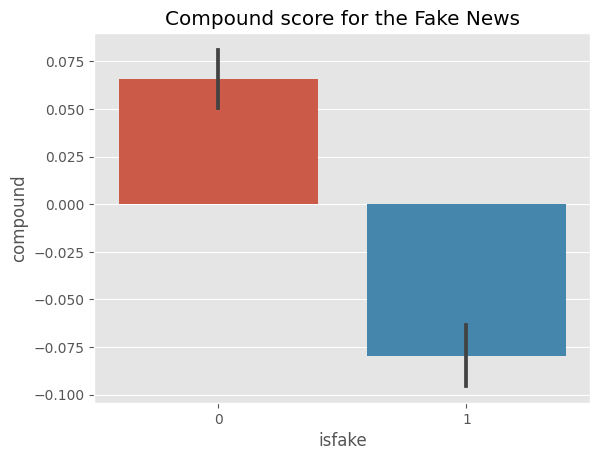

In [ ]:
ax = sns.barplot(data=vaders, x='isfake', y='compound')
ax.set_title('Compound score for the Fake News')
plt.show()

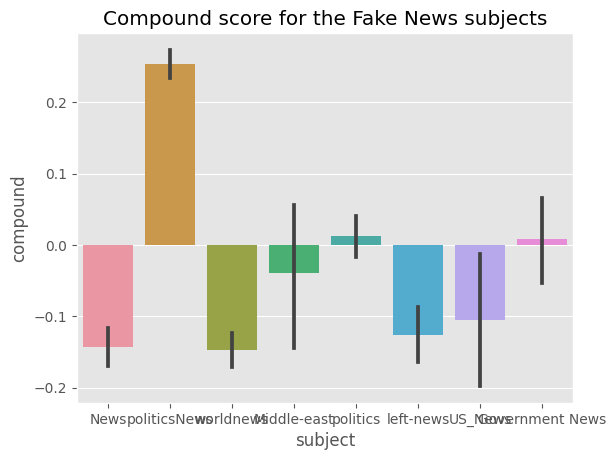

In [ ]:
ax = sns.barplot(data=vaders, x='subject', y='compound')
ax.set_title('Compound score for the Fake News subjects')
plt.show()

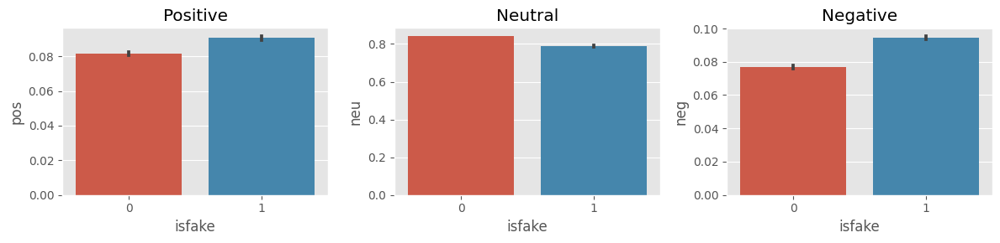

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(12, 3))
sns.barplot(data=vaders, x='isfake', y='pos', ax=axs[0])
sns.barplot(data=vaders, x='isfake', y='neu', ax=axs[1])
sns.barplot(data=vaders, x='isfake', y='neg', ax=axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

In [ ]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

config.json:   0%|          | 0.00/747 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

In [ ]:
# VADER results on example
print(example)
sia.polarity_scores(str(example))

10650    vicente brilliantly trolls trump disastrous we...
2041     warn china need respect south china ruling was...
8668     supreme court hears attempt change northern ir...
1114     guatemalan president survives congressional vo...
13902    mueller team uniform democratic donkey jerseys...
                               ...                        
11284    white house defends boehner lucifer comment cr...
11964    hilarious trump exposes stupidity puppet repor...
5390     mueller seeking testimony executives manafort ...
860      supreme court dismisses hawaii challenge trump...
15795    woman wants chair shut white people prejudiced...
Name: clean_joined, Length: 20000, dtype: object


{'neg': 0.098, 'neu': 0.717, 'pos': 0.185, 'compound': 0.8625}

In [ ]:
# Run for Roberta Model
encoded_text = tokenizer(str(example), return_tensors='pt')
output = model(**encoded_text)
scores = output[0][0].detach().numpy()
scores = softmax(scores)
scores_dict = {
    'roberta_neg' : scores[0],
    'roberta_neu' : scores[1],
    'roberta_pos' : scores[2]
}
print(scores_dict)

{'roberta_neg': 0.5237015, 'roberta_neu': 0.44331527, 'roberta_pos': 0.03298325}


In [ ]:
def polarity_scores_roberta(example):
    encoded_text = tokenizer(example, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
        'roberta_neg' : scores[0],
        'roberta_neu' : scores[1],
        'roberta_pos' : scores[2]
    }
    return scores_dict

In [ ]:
# #not this
# res = {}
# for i, row in tqdm(df.iterrows(), total=len(df)):
#     try:
#         text = row['text']
#         myid = row['id']
#         vader_result = sia.polarity_scores(text)
#         vader_result_rename = {}
#         for key, value in vader_result.items():
#             vader_result_rename[f"vader_{key}"] = value
#         roberta_result = polarity_scores_roberta(text)
#         both = {**vader_result_rename, **roberta_result}
#         res[myid] = both
#     except RuntimeError:
#         print(f'Broke for id {myid}')

# # First 500 texts
# # res = {}
# # num_rows_to_process = 500

# # for i, row in tqdm(df.head(num_rows_to_process).iterrows(), total=num_rows_to_process):
# #     try:
# #         text = row['text']
# #         myid = row['id']
# #         vader_result = sia.polarity_scores(text)
# #         vader_result_rename = {}
# #         for key, value in vader_result.items():
# #             vader_result_rename[f"vader_{key}"] = value
# #         roberta_result = polarity_scores_roberta(text)
# #         both = {**vader_result_rename, **roberta_result}
# #         res[myid] = both
# #     except RuntimeError:
# #         print(f'Broke for id {myid}')


In [ ]:
# res = {}

# for i, row in tqdm(df.iterrows(), total=len(df)):
#     try:
#         text = row['text']
#         myid = row['id']

#         # Check for empty or very short texts
#         if not text or len(text) < 3:
#             print(f'Skipping empty or very short text for id {myid}')
#             continue

#         vader_result = sia.polarity_scores(text)
#         vader_result_rename = {}
#         for key, value in vader_result.items():
#             vader_result_rename[f"vader_{key}"] = value

#         roberta_result = polarity_scores_roberta(text)

#         both = {**vader_result_rename, **roberta_result}
#         res[myid] = both

#     except RuntimeError as e:
#         print(f'Broke for id {myid}: {e}')
#     except IndexError as e:
#         print(f'Index error for id {myid}: {e}')

res = {}
batch_size = 100

for batch_start in tqdm(range(0, len(df_adjusted), batch_size)):
    batch_df = df_adjusted.iloc[batch_start:batch_start + batch_size]

    for i, row in batch_df.iterrows():
        try:
            text = row['text']
            myid = row['id']

            if not text or len(text) < 3:
                print(f'Skipping empty or very short text for id {myid}')
                continue

            vader_result = sia.polarity_scores(text)
            vader_result_rename = {f"vader_{key}": value for key, value in vader_result.items()}

            roberta_result = polarity_scores_roberta(text)

            both = {**vader_result_rename, **roberta_result}
            res[myid] = both

        except RuntimeError as e:
            print(f'Broke for id {myid}: {e}')
        except IndexError as e:
            print(f'Index error for id {myid}: {e}')



  0%|          | 0/200 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
Broke for id 14148: The expanded size of the tensor (1676) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 1676].  Tensor sizes: [1, 514]
Broke for id 2367: The expanded size of the tensor (1063) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 1063].  Tensor sizes: [1, 514]
Broke for id 16675: The expanded size of the tensor (705) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 705].  Tensor sizes: [1, 514]
Broke for id 16460: The expanded size of the tensor (830) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 830].  Tensor sizes: [1, 514]
Broke for id 11195: The expanded size of the tensor (1676) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 1676].  Tensor sizes: [1, 514]
Broke for id 4787: The expanded size of the tensor (549) must match the existing siz

In [ ]:
results_df = pd.DataFrame(res).T
results_df = results_df.reset_index().rename(columns={'index': 'id'})
results_df = results_df.merge(df_adjusted, how='left')

In [ ]:
results_df.columns

Index(['id', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound',
       'roberta_neg', 'roberta_neu', 'roberta_pos', 'title', 'text', 'subject',
       'date', 'isfake', 'original', 'clean', 'clean_joined'],
      dtype='object')

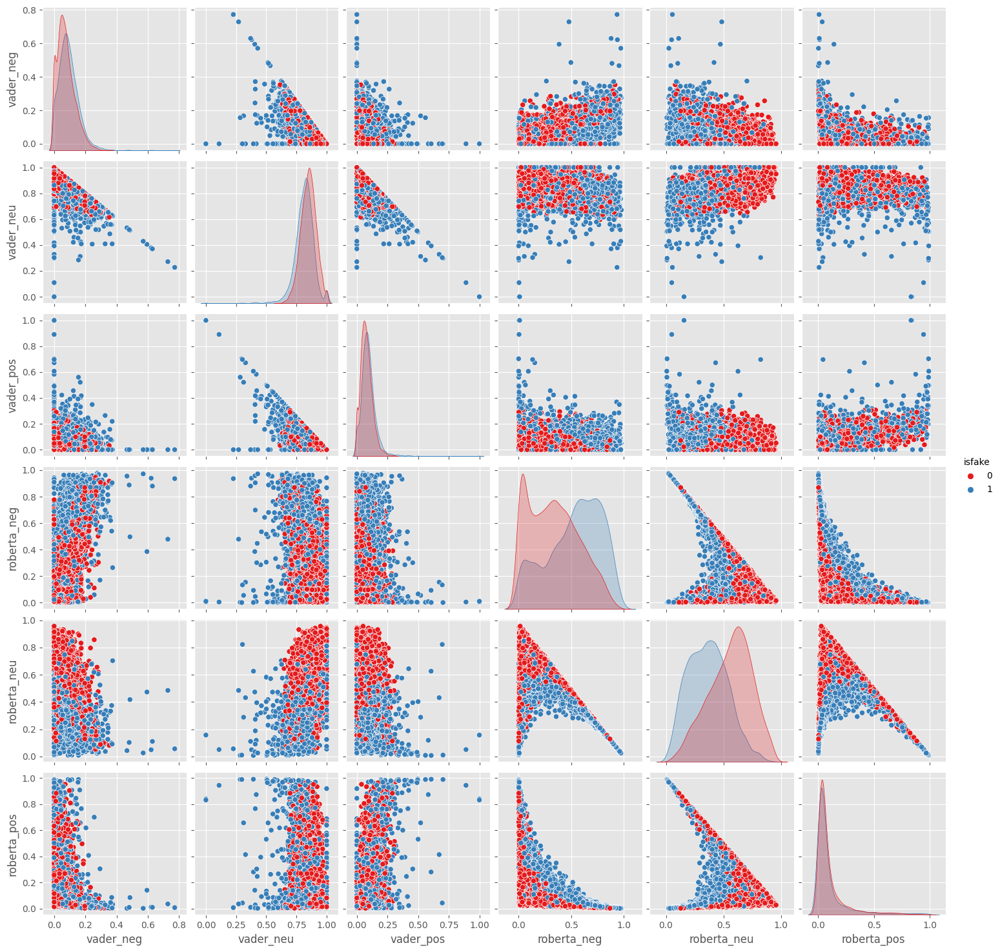

In [ ]:
sns.pairplot(data=results_df,
             vars=['vader_neg', 'vader_neu', 'vader_pos',
                  'roberta_neg', 'roberta_neu', 'roberta_pos',],
            hue='isfake',
            palette='Set1')
plt.show()

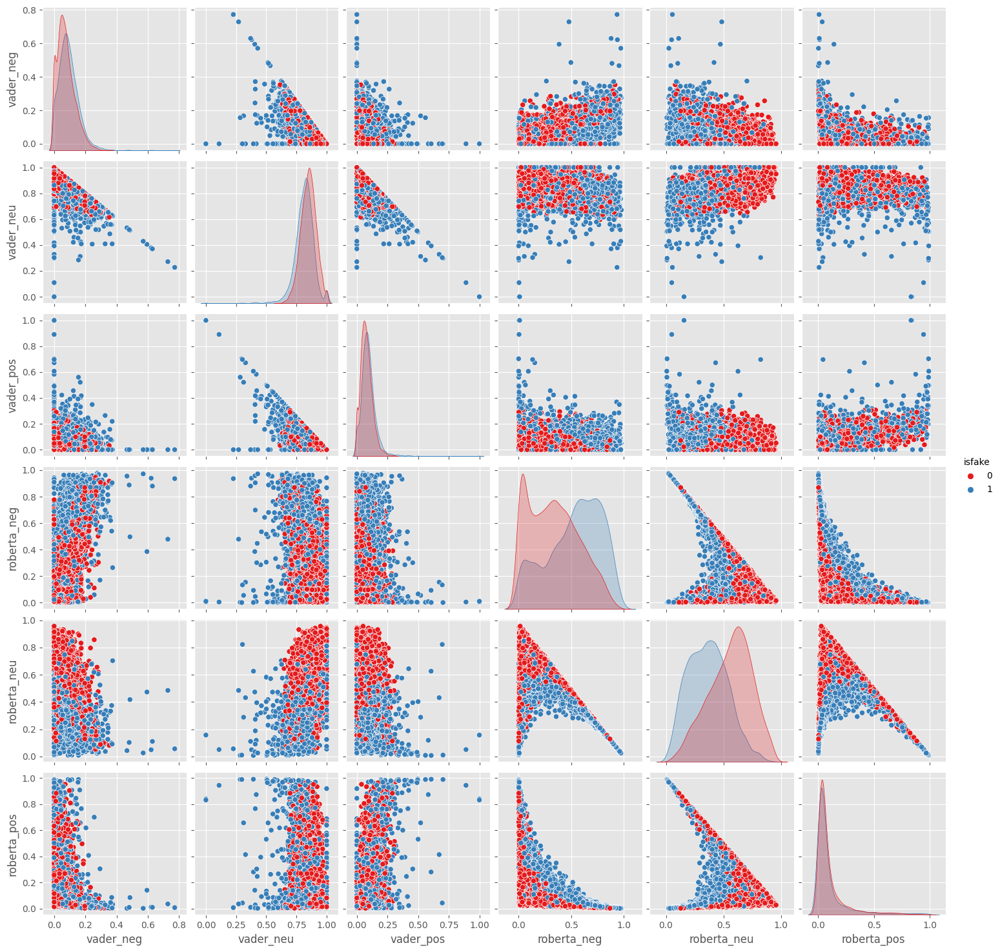

In [ ]:
sns.pairplot(data=results_df,
             vars=['vader_neg', 'vader_neu', 'vader_pos',
                  'roberta_neg', 'roberta_neu', 'roberta_pos',],
            hue='isfake',
            palette='Set1')
plt.show()

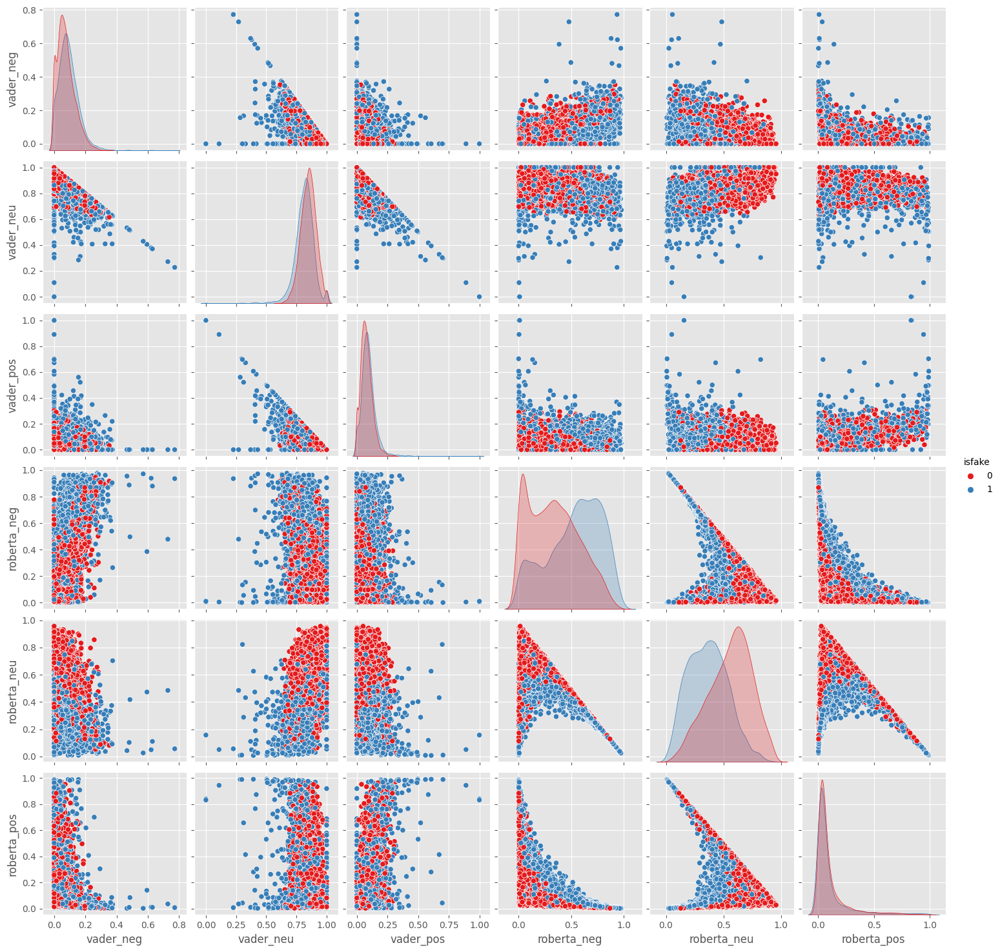

In [ ]:
sns.pairplot(data=results_df,
             vars=['vader_neg', 'vader_neu', 'vader_pos',
                  'roberta_neg', 'roberta_neu', 'roberta_pos',],
            hue='isfake',
            palette='Set1')
plt.show()

In [ ]:
results_df.query('isfake == 1') \
    .sort_values('roberta_fake', ascending=False)['text'].values[0]

In [ ]:
results_df.query('isfake == 0') \
    .sort_values('roberta_fake', ascending=False)['text'].values[0]

In [ ]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df_adjusted[df_adjusted.isfake == 1].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

In [ ]:
maxlen = -1
for doc in df_adjusted.clean_joined:
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("The maximum number of words in any document is =", maxlen)

The maximum number of words in any document is = 4405


In [ ]:
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df.clean_joined], nbins = 100)
fig.show()

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

# Perform sentiment analysis on 'original' column and store the compound score in 'vader_score'
df['vader_score'] = df['clean_joined'].apply(lambda x: sid.polarity_scores(x)['compound'])


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


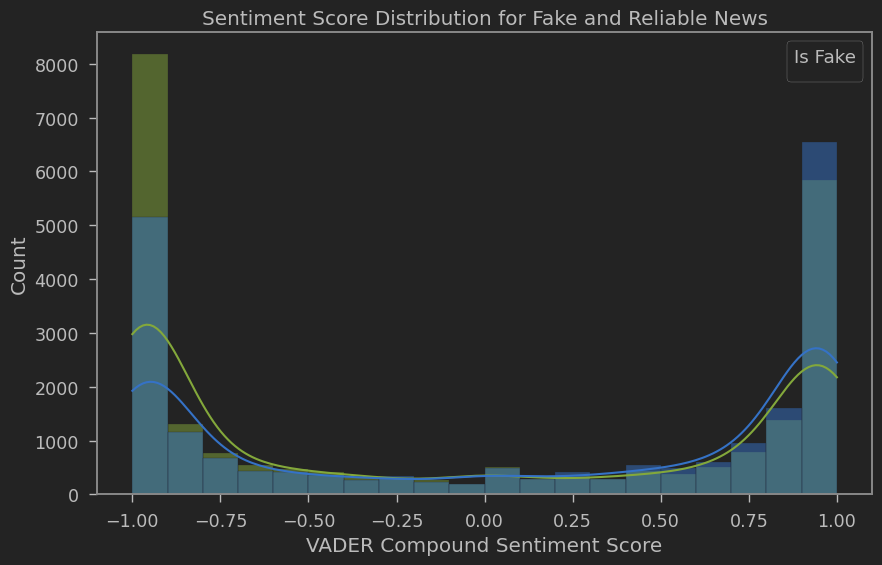

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='vader_score', hue='isfake', kde=True, bins=20)
plt.title('Sentiment Score Distribution for Fake and Reliable News')
plt.xlabel('VADER Compound Sentiment Score')
plt.legend(title='Is Fake')
plt.show()

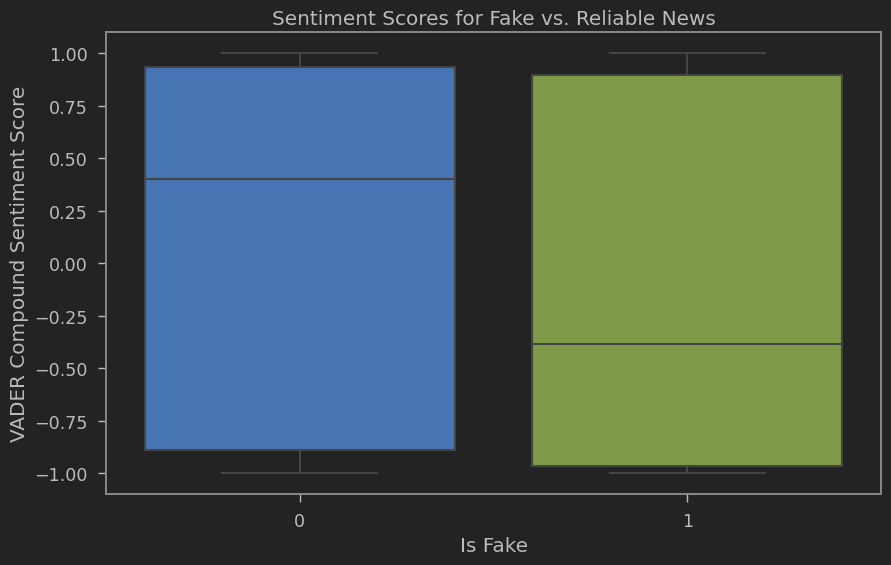

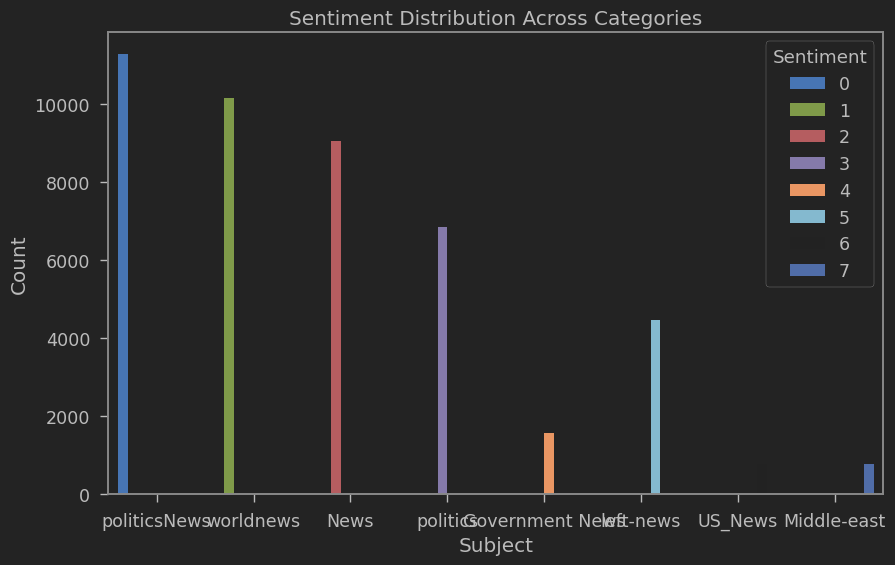

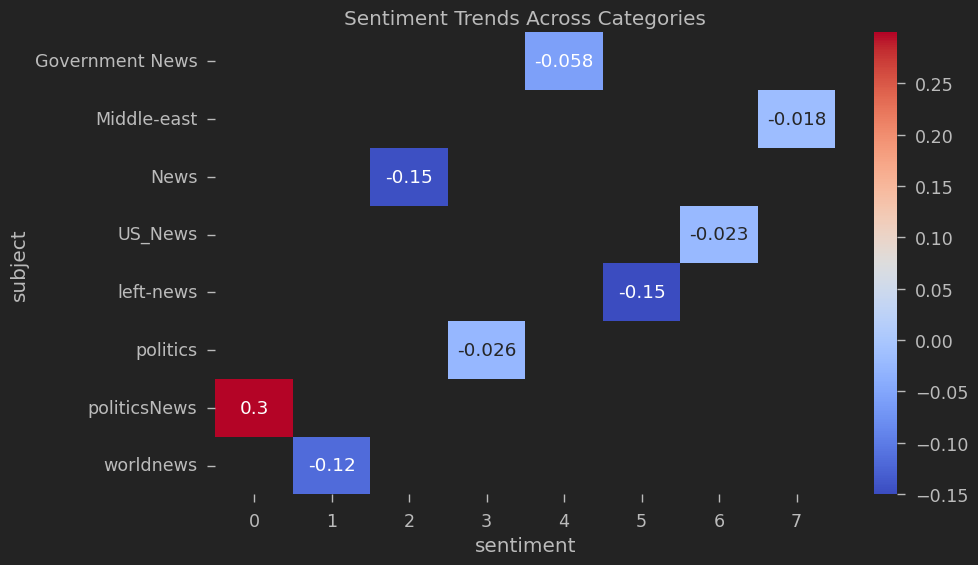

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Box plot of sentiment scores for fake and reliable news
plt.figure(figsize=(10, 6))
sns.boxplot(x='isfake', y='vader_score', data=df)
plt.title('Sentiment Scores for Fake vs. Reliable News')
plt.xlabel('Is Fake')
plt.ylabel('VADER Compound Sentiment Score')
plt.show()

# Bar plot showing counts of positive, negative, and neutral sentiments for each category
plt.figure(figsize=(10, 6))
sns.countplot(x='subject', hue='sentiment', data=df)
plt.title('Sentiment Distribution Across Categories')
plt.xlabel('Subject')
plt.ylabel('Count')
plt.legend(title='Sentiment')
plt.show()

# Scatter plot of sentiment scores vs. text length
# plt.figure(figsize=(10, 6))
# sns.scatterplot(x='text_length', y='vader_score', data=df)
# plt.title('Sentiment Score vs. Text Length')
# plt.xlabel('Text Length')
# plt.ylabel('VADER Compound Sentiment Score')
# plt.show()

# Heatmap for sentiment trends across categories
heatmap_data = df.pivot_table(index='subject', columns='sentiment', values='vader_score', aggfunc='mean')
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='coolwarm', annot=True)
plt.title('Sentiment Trends Across Categories')
plt.show()


In [ ]:
# split data into test and train
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(df.clean_joined, df.isfake, test_size = 0.2)
from nltk import word_tokenize


In [ ]:
# Create a tokenizer to tokenize the words and create sequences of tokenized words
tokenizer = Tokenizer(num_words = total_words)
tokenizer.fit_on_texts(x_train)
train_sequences = tokenizer.texts_to_sequences(x_train)
test_sequences = tokenizer.texts_to_sequences(x_test)
print("The encoding for document\n",df.clean_joined[0],"\n is : ",train_sequences[0])

The encoding for document
 budget fight looms republicans flip fiscal script washington reuters head conservative republican faction congress voted month huge expansion national debt cuts called fiscal conservative sunday urged budget restraint keeping sharp pivot republicans representative mark meadows speaking face nation drew hard line federal spending lawmakers bracing battle january return holidays wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy november congressional election campaigns approach republicans seek control congress president donald trump republicans want budget increase military spending democrats want proportional increases defense discretionary spending programs support education scientific research infrastructure public health environmental protection trump administration willing going increase defense discretionary spending percent meadows chairman small influential house freedom caucus said program democrats say

In [ ]:
# Add padding can either be maxlen = 4406 or smaller number maxlen = 40 seems to work well based on results
padded_train = pad_sequences(train_sequences,maxlen = 40, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences,maxlen = 40, truncating = 'post')
for i,doc in enumerate(padded_train[:2]):
     print("The padded encoding for document",i+1," is : ",doc)

The padded encoding for document 1  is :  [    1  1093  1609  2850  5308    32   147  7661    25     9    10     1
 22567   580    34   624   469    15     8  2452    94   258    32  1093
  3459  1609  2850  5328  8296   947    32  2935   441     1   319  4721
    19  1233    13    47]
The padded encoding for document 2  is :  [  618    31   353   392    48  1167  9250    46   149  3690     9   618
    31   353   392    48  1167   786  9250   651   126   325    17   273
     2    85  7575  5743   120  1007   283  1094  2182  1302  2278   871
 49711   618  3382   426]


In [ ]:
# Sequential Model
model = Sequential()

# embeddidng layer
model.add(Embedding(total_words, output_dim = 128))
# model.add(Embedding(total_words, output_dim = 240))


# Bi-Directional RNN and LSTM
model.add(Bidirectional(LSTM(128)))

# Dense layers
model.add(Dense(128, activation = 'relu'))
model.add(Dense(1,activation= 'sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 128)         13914112  
                                                                 
 bidirectional (Bidirectiona  (None, 256)              263168    
 l)                                                              
                                                                 
 dense (Dense)               (None, 128)               32896     
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 14,210,305
Trainable params: 14,210,305
Non-trainable params: 0
_________________________________________________________________


In [ ]:
total_words

108704

In [ ]:
y_train = np.asarray(y_train)
# train the model
model.fit(padded_train, y_train, batch_size = 64, validation_split = 0.1, epochs = 2)

Epoch 1/2
506/506 [==============================] - 274s 534ms/step - loss: 0.0444 - acc: 0.9834 - val_loss: 0.0075 - val_acc: 0.9978
Epoch 2/2
506/506 [==============================] - 275s 545ms/step - loss: 0.0023 - acc: 0.9996 - val_loss: 0.0045 - val_acc: 0.9983


In [ ]:
# make detection
detect = model.predict(padded_test)
# if the predicted value is >0.5 it is real else it is fake
detection = []
for i in range(len(detect)):
    if detect[i].item() > 0.5:
        detection.append(1)
    else:
        detection.append(0)
# getting the accuracy
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(list(y_test), detection)

print("Model Accuracy : ", accuracy)

281/281 [==============================] - 16s 55ms/step
Model Accuracy :  0.9985523385300669


In [ ]:
# get the confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(list(y_test), detection)
plt.figure(figsize = (25, 25))
sns.heatmap(cm, annot = True)

In [ ]:
# category dict
category = { 0: 'Fake News', 1 : "Reliable News"}


In [ ]:
def load_model_and_tokenizer():
    # Load the tokenizer and total_words from the previous code
    total_words = ...

    tokenizer = Tokenizer(num_words=total_words)
    model = Sequential()
    model.add(Embedding(total_words, output_dim=128))
    model.add(Bidirectional(LSTM(128)))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

    # Load the weights for the trained model
    model.load_weights("path_to_model_weights")  # Replace "path_to_model_weights" with the actual path of the model weights file

    return tokenizer, model

In [ ]:
# Function to preprocess and classify the news article
def classify_news_input(input_text, tokenizer, model):
    processed_text = preprocess(input_text)
    sequences = tokenizer.texts_to_sequences([processed_text])
    padded_sequences = pad_sequences(sequences, maxlen=40, padding='post', truncating='post')
    prediction = model.predict(padded_sequences)
    return "Reliable News" if prediction.item() > 0.5 else "Fake News"

# Call the function to load the tokenizer and model
tokenizer, model = load_model_and_tokenizer()

# Test with user input
user_input = input("Enter a news article for classification: ")
result = classify_news_input(user_input, tokenizer, model)
print("The news article is classified as:", result)

TypeError: ignored

-------------------------------------

In [ ]:
def classify_news(input_text, tokenizer, model):
    # Preprocess the input text
    processed_text = preprocess(input_text)

    # Tokenize and pad the processed text
    sequences = tokenizer.texts_to_sequences([processed_text])
    padded_sequences = pad_sequences(sequences, maxlen=40, padding='post', truncating='post')

    # Make prediction using the loaded model
    prediction = model.predict(padded_sequences)

    # If the predicted value is greater than 0.5, it is classified as "Reliable News",
    # otherwise, it is classified as "Fake News"
    if prediction.item() > 0.5:
        return "Reliable News"
    else:
        return "Fake News"


# Call the function to load the tokenizer and model
tokenizer, model = load_model_and_tokenizer()

TypeError: ignored

In [ ]:


# Now, let's say you have a fake news and a reliable news for testing purposes
fake_news = "This is a fake news article with misleading information."
reliable_news = "This is a reliable news article with accurate information."

# Classify the fake news and reliable news using the classify_news function
result_fake = classify_news(fake_news, tokenizer, model)
result_reliable = classify_news(reliable_news, tokenizer, model)

print("Fake News:", result_fake)
print("Reliable News:", result_reliable)


NameError: ignored

In [ ]:
# Your existing code...

# Now, let's say you have a fake news and a reliable news for testing purposes
fake_news = "This is a reliable news article with misleading information."
reliable_news = "This is a reliable news article with accurate information."

# Preprocess the news articles
processed_fake_news = preprocess(fake_news)
processed_reliable_news = preprocess(reliable_news)

# Tokenize and pad the news articles
fake_sequences = tokenizer.texts_to_sequences([processed_fake_news])
reliable_sequences = tokenizer.texts_to_sequences([processed_reliable_news])

padded_fake_sequences = pad_sequences(fake_sequences, maxlen=40, padding='post', truncating='post')
padded_reliable_sequences = pad_sequences(reliable_sequences, maxlen=40, padding='post', truncating='post')

# Make predictions using the model
prediction_fake = model.predict(padded_fake_sequences)
prediction_reliable = model.predict(padded_reliable_sequences)

# If the predicted value is greater than 0.5, it is classified as "Reliable News",
# otherwise, it is classified as "Fake News"
result_fake = "Reliable News" if prediction_fake.item() > 0.5 else "Fake News"
result_reliable = "Reliable News" if prediction_reliable.item() > 0.5 else "Fake News"

print("Fake News:", result_fake)
print("Reliable News:", result_reliable)


1/1 [==============================] - 0s 26ms/step
Fake News: Fake News
Reliable News: Fake News


In [ ]:
# Your existing code...

# Now, let's say you have a fake news and a reliable news for testing purposes
fake_news = "House Intelligence Committee Chairman Devin Nunes is going to have a bad day. He s been under the assumption, like many of us, that the Christopher Steele-dossier was what prompted the Russia investigation so he s been lashing out at the Department of Justice and the FBI in order to protect Trump. As it happens, the dossier is not what started the investigation, according to documents obtained by the New York Times.Former Trump campaign adviser George Papadopoulos was drunk in a wine bar when he revealed knowledge of Russian opposition research on Hillary Clinton.On top of that, Papadopoulos wasn t just a covfefe boy for Trump, as his administration has alleged. He had a much larger role, but none so damning as being a drunken fool in a wine bar. Coffee boys  don t help to arrange a New York meeting between Trump and President Abdel Fattah el-Sisi of Egypt two months before the election. It was known before that the former aide set up meetings with world leaders for Trump, but team Trump ran with him being merely a coffee boy.In May 2016, Papadopoulos revealed to Australian diplomat Alexander Downer that Russian officials were shopping around possible dirt on then-Democratic presidential nominee Hillary Clinton. Exactly how much Mr. Papadopoulos said that night at the Kensington Wine Rooms with the Australian, Alexander Downer, is unclear,  the report states.  But two months later, when leaked Democratic emails began appearing online, Australian officials passed the information about Mr. Papadopoulos to their American counterparts, according to four current and former American and foreign officials with direct knowledge of the Australians  role. Papadopoulos pleaded guilty to lying to the F.B.I. and is now a cooperating witness with Special Counsel Robert Mueller s team.This isn t a presidency. It s a badly scripted reality TV show.Photo by Win McNamee/Getty Images."
reliable_news = " U.S. President Donald Trump called on the Republican Congress to pass a short-term government spending bill later on Thursday to avoid a shutdown when current funding expires at midnight on Friday. Republicans in the House of Representatives have unveiled a stopgap spending bill that would allow the government to stay open at current funding levels. â€œPass the C.R. (continuing resolution) TODAY and keep our Government OPEN!â€ Trump wrote in a post on Twitter."

# Preprocess the news articles
processed_fake_news = preprocess(fake_news)
processed_reliable_news = preprocess(reliable_news)

# Tokenize and pad the news articles
fake_sequences = tokenizer.texts_to_sequences([processed_fake_news])
reliable_sequences = tokenizer.texts_to_sequences([processed_reliable_news])

padded_fake_sequences = pad_sequences(fake_sequences, maxlen=40, padding='post', truncating='post')
padded_reliable_sequences = pad_sequences(reliable_sequences, maxlen=40, padding='post', truncating='post')

# Make predictions using the model
prediction_fake = model.predict(padded_fake_sequences)
prediction_reliable = model.predict(padded_reliable_sequences)

# If the predicted value is greater than 0.5, it is classified as "Reliable News",
# otherwise, it is classified as "Fake News"
result_fake = "Reliable News" if prediction_fake.item() > 0.5 else "Fake News"
result_reliable = "Reliable News" if prediction_reliable.item() > 0.5 else "Fake News"

print("Fake News:", result_fake)
print("Reliable News:", result_reliable)


1/1 [==============================] - 0s 42ms/step
Fake News: Fake News
Reliable News: Reliable News


In [ ]:
df_adjusted

,title,text,subject,date,isfake,original,clean,clean_joined,id
10650,Vicente Fox Brilliantly Trolls Trump’s Disast...,Former Mexican President Vicente Fox has never...,News,"May 17, 2017",1,Vicente Fox Brilliantly Trolls Trump’s Disast...,"[vicente, brilliantly, trolls, trump, disastro...",vicente brilliantly trolls trump disastrous we...,10651
2041,U.S. and EU warn China on need to respect Sout...,WASHINGTON (Reuters) - The United States and t...,politicsNews,"February 18, 2016",0,U.S. and EU warn China on need to respect Sout...,"[warn, china, need, respect, south, china, rul...",warn china need respect south china ruling was...,2042
8668,UK Supreme Court hears attempt to change North...,LONDON (Reuters) - An attempt to change the la...,worldnews,"October 24, 2017",0,UK Supreme Court hears attempt to change North...,"[supreme, court, hears, attempt, change, north...",supreme court hears attempt change northern ir...,8669
1114,Guatemalan president survives congressional vo...,GUATEMALA CITY (Reuters) - Guatemala s Congres...,worldnews,"September 12, 2017",0,Guatemalan president survives congressional vo...,"[guatemalan, president, survives, congressiona...",guatemalan president survives congressional vo...,1115
13902,Mueller Team Uniform? ‘Democratic Donkey Jerse...,Deputy Attorney General Rod Rosenstein appeare...,Middle-east,"December 13, 2017",1,Mueller Team Uniform? ‘Democratic Donkey Jerse...,"[mueller, team, uniform, democratic, donkey, j...",mueller team uniform democratic donkey jerseys...,13903
...,...,...,...,...,...,...,...,...,...
11284,White House Defends Boehner’s ‘Lucifer’ Comme...,Ever since former House Speaker John Boehner a...,News,"April 29, 2016",1,White House Defends Boehner’s ‘Lucifer’ Comme...,"[white, house, defends, boehner, lucifer, comm...",white house defends boehner lucifer comment cr...,11285
11964,HILARIOUS: TRUMP EXPOSES STUPIDITY OF NBC PUPP...,Trump made sure everyone got a chance to see h...,politics,"Aug 19, 2015",1,HILARIOUS: TRUMP EXPOSES STUPIDITY OF NBC PUPP...,"[hilarious, trump, exposes, stupidity, puppet,...",hilarious trump exposes stupidity puppet repor...,11965
5390,Mueller seeking testimony from PR executives w...,WASHINGTON (Reuters) - Special Counsel Robert ...,politicsNews,"August 25, 2017",0,Mueller seeking testimony from PR executives w...,"[mueller, seeking, testimony, executives, mana...",mueller seeking testimony executives manafort ...,5391
860,Supreme Court dismisses Hawaii's challenge to ...,WASHINGTON (Reuters) - The U.S. Supreme Court ...,politicsNews,"October 24, 2017",0,Supreme Court dismisses Hawaii's challenge to ...,"[supreme, court, dismisses, hawaii, challenge,...",supreme court dismisses hawaii challenge trump...,861
